# Preference Learning - Part V (non-TOU)
## 1. Principle Component Analysis (PCA)
## 2. K-mean clustering with/without normalization

In [2]:
%matplotlib inline
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import json
from pandas.io.json import json_normalize #package for flattening json in pandas df
import matplotlib.pyplot as plt
from datetime import date, timedelta, datetime

## 1. Principle Component Analysis
We first focus on the non-event data. For each hour, 

(1) the first approach is we do principle component analysis and get several explanable top PCs and then use the top PCs to do K-mean clustering to find out groups; 

(2) the second approach is forget about PCA, and start by drawing histogram of distribution on a temp, consumption, occurence 3D space, and using GMM to fit the data and find out the classes.

In [ ]:
# Import all preprocessed data necessary for the analysis
df_tou1h = pd.read_csv("C:\\Users\\Rockwell\\Desktop\\Paper4\\data_collection\\data_tables\\Consumption_tou2013_1h.csv")
df_Ntou1h = pd.read_csv("C:\\Users\\Rockwell\\Desktop\\Paper4\\data_collection\\data_tables\\Consumption_Ntou2013_1h.csv")
df_wea1h = pd.read_csv("C:\\Users\\Rockwell\\Desktop\\Paper4\\data_collection\\weather\\LondonWeather2013_interpolated.csv")
df_tariff_1h = pd.read_csv("C:\\Users\\Rockwell\\Desktop\\Paper4\\data_collection\\data_tables\\df_tariff_1h.csv")

In [3]:
import os
os.getcwd()

'/Users/Rockwell/Documents/GitHub/Demand-Response'

In [4]:
# for ios system, import all data necessary for the analysis
df_tou1h = pd.read_csv('/Users/Rockwell/Desktop/PhD/Paper4PreferenceLearning/data/Consumption_tou2013_1h.csv')
df_Ntou1h = pd.read_csv('/Users/Rockwell/Desktop/PhD/Paper4PreferenceLearning/data/Consumption_Ntou2013_1h.csv')
df_wea1h = pd.read_csv('/Users/Rockwell/Desktop/PhD/Paper4PreferenceLearning/data/LondonWeather2013_interpolated.csv')
df_tariff_1h = pd.read_csv('/Users/Rockwell/Desktop/PhD/Paper4PreferenceLearning/data/df_tariff_1h.csv')

In [5]:
# first, create a list of days that belongs to event days
event_days = set()
event_series = df_tariff_1h[df_tariff_1h.Event_tags.notnull()].GMT
for i in event_series:
    event_days.add(datetime.strptime(i[:10], "%Y-%m-%d" ).date()) # add all event dates to the set
df_help = pd.DataFrame(pd.to_datetime(df_tariff_1h.GMT).dt.date) #str to datatime and extract date then make it to dataframe
# df_help[df_help['GMT'].isin(event_days)] #this shows the event days
# we can use ~df_help['GMT'].isin(event_days) to generate any non-flexible period items

# create TOU and non-TOU demand data in non-flexible hours
df_wea1h_nf = df_wea1h[~df_help['GMT'].isin(event_days)]
df_Ntou1h_nf = df_Ntou1h[~df_help['GMT'].isin(event_days)]
df_tou1h_nf = df_tou1h[~df_help['GMT'].isin(event_days)]

In [6]:
# seperate the above data set based on the seasonal effect
# i.e., months of 11, 12, 1, 2, 3 are in a group - cold season
# months of 4, 5, 6, 7, 8, 9, 10 are in another group - warm season
cold_season = [11, 12, 1, 2, 3]
warm_season = [4, 5, 6, 7, 8, 9, 10]
df_help_season = pd.DataFrame(pd.to_datetime(df_wea1h_nf.GMT).dt.month)
df_wea1h_nf_cold = df_wea1h_nf[df_help_season['GMT'].isin(cold_season)]
df_wea1h_nf_warm = df_wea1h_nf[df_help_season['GMT'].isin(warm_season)]
df_Ntou1h_nf_cold = df_Ntou1h_nf[df_help_season['GMT'].isin(cold_season)]
df_Ntou1h_nf_warm = df_Ntou1h_nf[df_help_season['GMT'].isin(warm_season)]
df_tou1h_nf_cold = df_tou1h_nf[df_help_season['GMT'].isin(cold_season)]
df_tou1h_nf_warm = df_tou1h_nf[df_help_season['GMT'].isin(warm_season)]

In [7]:
# due to the null values of Ntou data, even if we use mean value to replace the null, it happens that some users' consumption in a time period of days are always null, which leads to null average value, to get rid of the problem, we delete these customers.
df_Ntou1h_nf_cold = df_Ntou1h_nf_cold.dropna(axis=1)
df_Ntou1h_nf_warm = df_Ntou1h_nf_warm.dropna(axis=1)

In [8]:
df_Ntou1h_nf_warm

,GMT,N0000,N0002,N0003,N0009,N0010,N0011,N0013,N0014,N0016,...,N4153,N4154,N4162,N4165,N4166,N4167,N4168,N4170,N4171,N4172
2160,2013-04-01 00:00:00,0.334,0.030,0.087,0.664,6.788,0.036,0.482,1.215,0.019,...,0.373,0.104,0.071,0.055,0.037,0.451,0.122,0.174,0.079,0.330
2161,2013-04-01 01:00:00,0.353,0.029,0.072,0.563,0.544,0.036,0.389,1.129,0.010,...,0.147,0.102,0.064,0.068,0.082,0.599,0.086,0.088,0.079,0.130
2162,2013-04-01 02:00:00,0.409,0.064,0.072,0.542,0.538,0.013,0.338,1.118,0.011,...,0.162,0.103,0.050,0.067,0.037,0.406,0.119,0.132,0.101,0.431
2163,2013-04-01 03:00:00,0.543,0.094,0.126,0.569,0.477,0.040,0.250,1.147,0.010,...,0.174,0.088,0.049,0.060,0.037,0.517,0.114,0.128,0.039,0.464
2164,2013-04-01 04:00:00,0.423,0.091,0.072,0.531,0.472,0.040,0.248,1.164,0.397,...,0.131,0.050,0.048,0.070,0.041,0.608,0.105,0.085,0.000,0.176
2165,2013-04-01 05:00:00,0.457,0.095,0.063,0.541,0.488,0.012,0.256,1.180,0.229,...,0.111,0.145,0.058,0.055,0.807,2.614,0.097,0.148,0.092,0.141
2166,2013-04-01 06:00:00,0.463,0.078,0.117,0.925,0.447,0.135,0.245,1.266,0.014,...,0.166,0.121,0.131,0.060,3.171,1.058,0.116,0.114,0.063,0.189
2167,2013-04-01 07:00:00,0.459,0.029,0.189,1.319,0.551,0.382,0.245,1.225,0.010,...,0.140,0.047,0.049,0.063,3.383,1.249,0.102,0.086,0.283,0.453
2168,2013-04-01 08:00:00,0.500,0.619,0.655,1.240,1.314,0.510,0.242,1.164,0.010,...,0.456,0.048,0.753,0.157,1.696,1.802,0.082,0.145,0.108,0.365
2169,2013-04-01 09:00:00,0.483,0.484,0.753,1.072,2.752,0.453,0.354,1.416,0.132,...,1.235,0.183,0.183,0.222,0.176,2.936,0.104,0.109,0.075,0.354


(0) Some basic temperature distribution of the two groups are given below

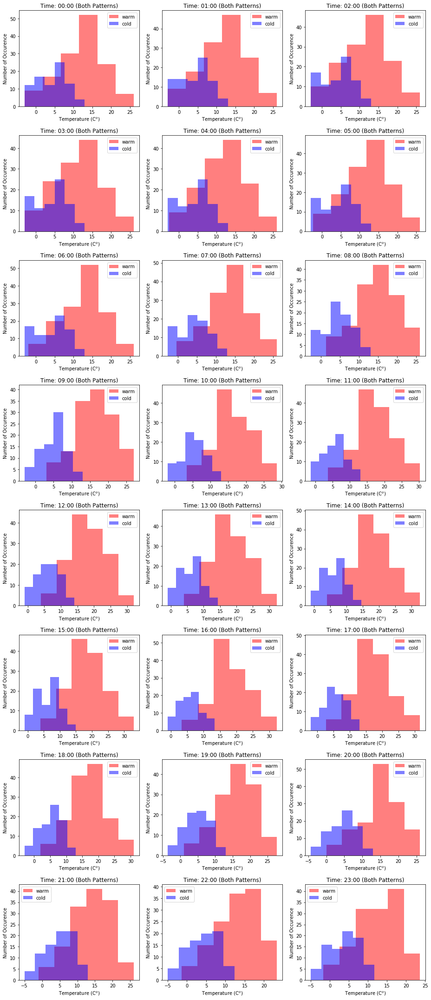

In [8]:
# temperature distribution of different hours of a day in a year
fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        ax.hist(df_wea1h_nf_warm[df_Ntou1h_nf_warm.GMT.str.contains('0' + str(i) + ':00:00')]['TempC'], bins=6, color = 'red', alpha = 0.5, label = 'warm')
        ax.hist(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]['TempC'], bins=6, color = 'blue', alpha = 0.5, label = 'cold')
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Both Patterns)')
        ax.legend()
        ax.set_xlabel(r'Temperature (C$^o$)')
        ax.set_ylabel('Number of Occurence')
    else:
        ax.hist(df_wea1h_nf_warm[df_Ntou1h_nf_warm.GMT.str.contains(str(i) + ':00:00')]['TempC'], bins=6, color = 'red', alpha = 0.5, label = 'warm')
        ax.hist(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]['TempC'], bins=6, color = 'blue', alpha = 0.5, label = 'cold')
        ax.set_title('Time: ' + str(i) + ':00' + ' (Both Patterns)')
        ax.legend()
        ax.set_xlabel(r'Temperature (C$^o$)')
        ax.set_ylabel('Number of Occurence')
plt.tight_layout()

(1) In PCA, we don't consider normalization since all the consumptions have the same unit, we care about the absolute change rather than relative change since DR targets the customer who has largest potential shiftable load instead of largest price-responsiveness rate. Also we have seperate data by hours, so the temp-consumption relationship at different hours has been treated seprately and equally, so the time effect won't be a concern to let us normalize the data.

In [19]:
df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('09:00:00')].transpose()

,9,33,57,105,129,201,273,321,345,417,...,8409,8433,8505,8529,8553,8577,8601,8649,8673,8745
GMT,2013-01-01 09:00:00,2013-01-02 09:00:00,2013-01-03 09:00:00,2013-01-05 09:00:00,2013-01-06 09:00:00,2013-01-09 09:00:00,2013-01-12 09:00:00,2013-01-14 09:00:00,2013-01-15 09:00:00,2013-01-18 09:00:00,...,2013-12-17 09:00:00,2013-12-18 09:00:00,2013-12-21 09:00:00,2013-12-22 09:00:00,2013-12-23 09:00:00,2013-12-24 09:00:00,2013-12-25 09:00:00,2013-12-27 09:00:00,2013-12-28 09:00:00,2013-12-31 09:00:00
N0000,0.448,0.528,0.619,0.607,0.66,0.361,0.486,1.006,0.602,0.967,...,0.248,0.477,0.585,0.483,0.369,0.36,1.982,0.362,0.34,0.415
N0001,0.228,0.243,0.263,0.234,0.262,0.947,0.099,0.447,1.327,0.304,...,0.464,0.566,0.474,0.489,0.462,0.606,0.65,0.643,0.626,0.637
N0002,0.238,0.594,0.487,0.316,0.539,0.584,0.478,0.585,0.565,0.548,...,0.226,0.344,0.224,0.387,0.457,0.06,0.078,0.315,0.528,0.259
N0003,0.598,0.543,0.371,0.351,0.758,0.433,0.318,0.358,0.697,0.594,...,0.585,0.814,0.556,0.734,0.75,0.49,1.506,1.009,0.569,0.508
N0004,0.305,0.344,0.417,0.115,0.116,0.272,0.504,0.219,0.484,0.305,...,0.201,0.549,0.349,0.382,0.399,0.428,0.771,0.209,0.243,0.855
N0006,0,0,0,0,0,0,0.25,0.215,0.286,0,...,0,0,0,0,0.313,0.039,0.257,0.031,0.176,0.185
N0007,0.167,0.163,0.166,0.169,0.148,0.263,0.151,0.393,0.35,0.147,...,0.373,0.253,0.398,0.326,0.194,0.307,0.156,0.157,0.496,0.272
N0008,0.151,0.48,0.627,0.651,0.304,0.481,0.187,1.022,0.562,0.731,...,0.206,0.49,0.629,0.684,0.543,0.13,0.161,0.139,0.644,0.302
N0010,0.576,0.585,0.714,0.621,0.771,0.843,0.837,3.754,3.375,5.75,...,1.704,2.467,0.58,1.303,1.185,1.571,2.877,0.366,0.362,0.656


In [20]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
# Test with 9:00 am TOU data
x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('09:00:00')]
x.set_index('GMT', inplace = True)
x = x.transpose().dropna() # data for the specific hour, and filtering out null value
x = x.values
x = StandardScaler().fit_transform(x)
pca = PCA()# keep all columns to cover 100% variance
principleComponents = pca.fit_transform(x)
principleDf = pd.DataFrame(data = principleComponents)
principleDf

,0,1,2,3,4,5,6,7,8,9,...,73,74,75,76,77,78,79,80,81,82
0,0.696850,-0.392040,-1.587490,-0.416721,0.019867,0.137950,0.275227,0.460821,-0.205474,-0.119370,...,0.439896,0.542050,0.278494,-0.378305,0.265650,0.419005,0.200084,-0.093163,0.117992,0.497846
1,0.106872,4.596487,1.125372,-0.395187,-0.325788,-0.520279,0.289134,-0.768706,-0.330302,0.404762,...,0.471447,-0.383166,0.143840,0.514064,-0.233474,0.851595,-0.879139,0.070116,-0.721161,0.072862
2,-1.393696,-0.190694,0.456048,-0.618870,0.286823,-0.347357,-0.936676,-0.201528,-0.314644,0.310874,...,0.110387,0.066755,-0.215098,-0.246947,0.117717,-0.085882,0.376718,0.306136,0.172734,0.076996
3,1.144654,0.081912,-0.119173,1.058585,0.030971,-0.412492,-0.368672,0.042967,-0.031950,-0.666185,...,0.038138,0.395698,-0.570160,0.755249,0.121385,-0.275641,0.098356,-0.255924,-0.449570,-0.018039
4,-0.773436,-0.021807,0.918711,-0.779132,1.531794,0.773537,-1.528768,-0.096780,0.646604,-0.567711,...,-0.389100,0.148345,0.171405,0.361552,-0.022144,0.536110,-0.181630,-0.704808,0.092665,0.030516
5,-5.445869,-1.396856,0.372217,-0.119503,0.927360,0.117048,0.258936,-0.135574,-0.075882,-0.199234,...,0.058762,-0.164911,-0.148460,-0.095537,0.044441,0.066388,-0.150734,-0.216184,-0.241781,-0.217099
6,-3.300683,0.659808,0.558363,0.031726,0.301340,0.319685,0.625052,0.123881,0.202361,-0.318970,...,-0.356112,-0.111429,-0.034941,0.146389,0.293691,0.137995,-0.301298,-0.139826,-0.042127,-0.361898
7,-0.731941,-0.005233,0.744024,-0.013920,-0.199069,0.187361,-0.013915,0.366988,0.022477,0.681687,...,-0.279240,0.514172,-0.188681,0.114130,0.184327,0.029752,-0.172139,0.984903,-0.127714,-0.208765
8,24.719375,-4.070434,4.821968,-4.681213,5.344769,-3.283358,1.501403,1.404125,-0.777467,1.377323,...,-0.223087,0.188577,2.838325,-1.674961,-0.152711,-0.748115,0.716326,0.260609,0.540844,0.796025
9,-0.903320,0.315381,-0.097327,0.007483,0.170571,0.132724,-0.268336,-0.242824,0.443323,-0.189906,...,0.007418,-0.024851,-0.008446,-0.266745,-0.050488,0.292166,0.058653,0.159624,0.221993,0.097670


In [15]:
sum(x[:,0])

4.796163466380676e-14

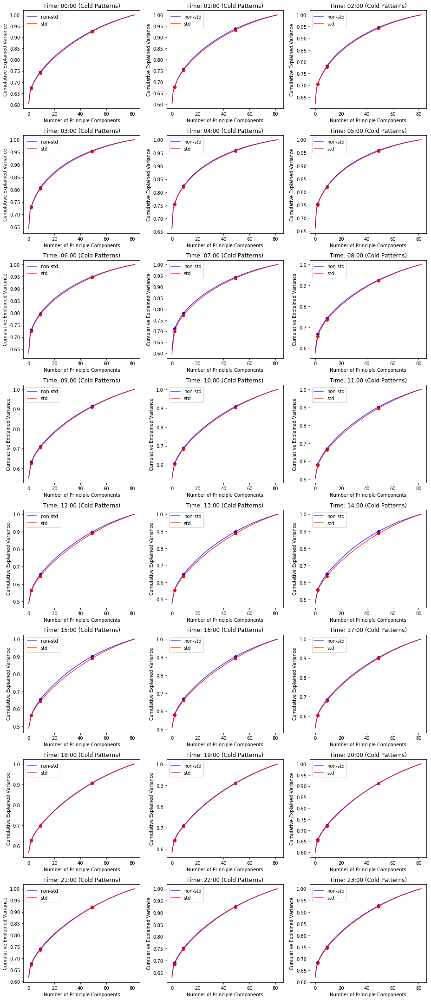

In [21]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.plot(np.cumsum(pca_nstd.explained_variance_ratio_), c = 'blue', label = 'non-std', alpha = 0.8)
        ax.plot([2, 9, 49], [np.cumsum(pca_nstd.explained_variance_ratio_)[2], np.cumsum(pca_nstd.explained_variance_ratio_)[9], np.cumsum(pca_nstd.explained_variance_ratio_)[49]], 'bo')
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
        ax.plot(np.cumsum(pca.explained_variance_ratio_), c = 'red', label = 'std', alpha = 0.8)
        ax.plot([2, 9, 49], [np.cumsum(pca.explained_variance_ratio_)[2], np.cumsum(pca.explained_variance_ratio_)[9], np.cumsum(pca.explained_variance_ratio_)[49]], 'ro')
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Number of Principle Components')
        ax.set_ylabel('Cumulative Explained Variance')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.plot(np.cumsum(pca_nstd.explained_variance_ratio_), c = 'blue', label = 'non-std', alpha = 0.8)
        ax.plot([2, 9, 49], [np.cumsum(pca_nstd.explained_variance_ratio_)[2], np.cumsum(pca_nstd.explained_variance_ratio_)[9], np.cumsum(pca_nstd.explained_variance_ratio_)[49]], 'bo')
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
        ax.plot(np.cumsum(pca.explained_variance_ratio_), c = 'red', label = 'std', alpha = 0.8)
        ax.plot([2, 9, 49], [np.cumsum(pca.explained_variance_ratio_)[2], np.cumsum(pca.explained_variance_ratio_)[9], np.cumsum(pca.explained_variance_ratio_)[49]], 'ro')
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Number of Principle Components')
        ax.set_ylabel('Cumulative Explained Variance')
plt.tight_layout()

The above pictures show that using the first 3 PCs can always explain from 48% to 72% amount of variance. 

Next we will give the meaning of the first 3 PCs:

PC1 & PC2: temperature related (no matter of standarization, PC1 and PC2 are somehow correlated)

PC3: related to days of week, since the coeffients of Friday and Saturday are skewied to positive area, if there's not correlation, it should always be equally distributed around 0

Using the 3 components to do k-mean clustering and we can get several groups

Coloring them in a 3D space (or if the first two PCs leads to some confustion, maybe do 2D with 3 differnt projections)

Then we could try to color them in a 2D slice surphase (temp vs day of week, temp )


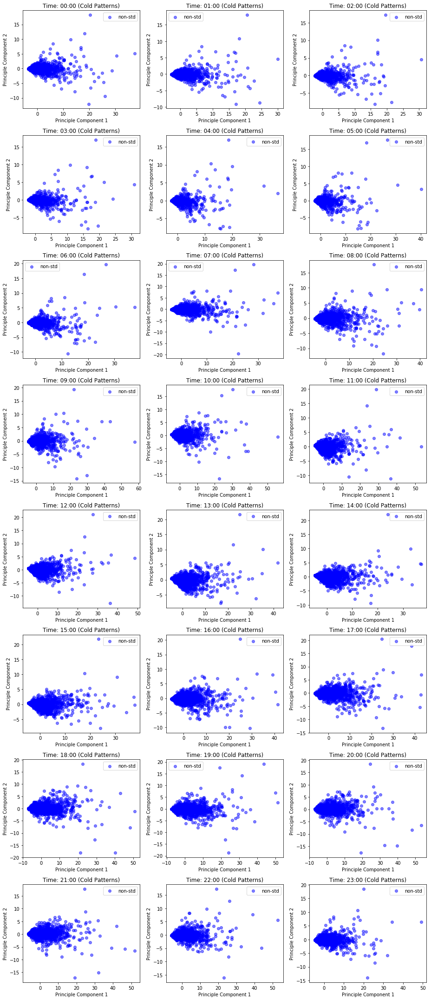

In [22]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(principleDf_nstd[0], principleDf_nstd[1], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
#         ax.scatter(principleDf[0], principleDf[1], c = 'red', label = 'std', alpha = 0.1)
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 1')
        ax.set_ylabel('Principle Component 2')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(principleDf_nstd[0], principleDf_nstd[1], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
#         ax.scatter(principleDf[0], principleDf[1], c = 'red', label = 'std', alpha = 0.1)
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 1')
        ax.set_ylabel('Principle Component 2')
plt.tight_layout()

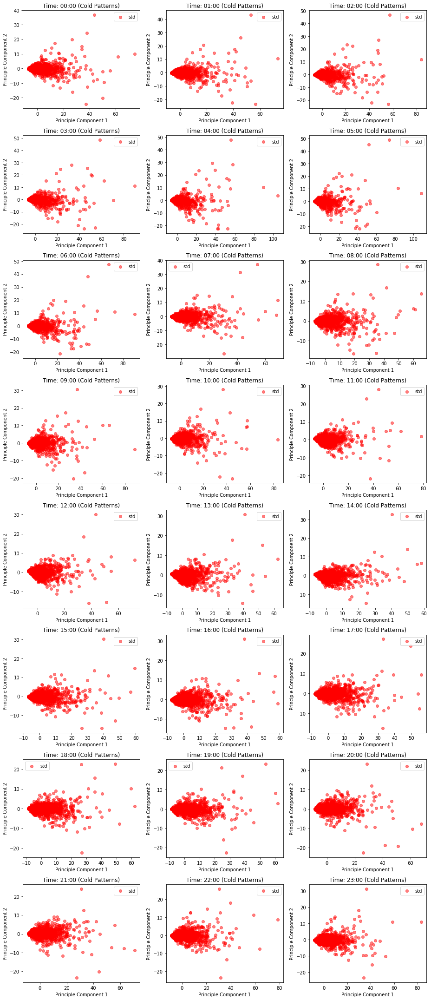

In [23]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
#         ax.scatter(principleDf_nstd[0], principleDf_nstd[1], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
        ax.scatter(principleDf[0], principleDf[1], c = 'red', label = 'std', alpha = 0.5)
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 1')
        ax.set_ylabel('Principle Component 2')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
#         ax.scatter(principleDf_nstd[0], principleDf_nstd[1], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
        ax.scatter(principleDf[0], principleDf[1], c = 'red', label = 'std', alpha = 0.5)
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 1')
        ax.set_ylabel('Principle Component 2')
plt.tight_layout()

Different from the size-and-variable both standardization in paper 2, we care about the size effect. So we do not perform size standardization. Also in paper2, the author worried about the correlated problems, which wouldn't appear if they didn't use the no-size-scaled PCA to perform K-mean clustering. So the reason that problem seems to exist is they used the different PCA as the input of K-mean clustering and get the different labels, then put these labels to the previous PCA method, it seems that in Fig2 of their paper, each "category" seems has PC1 and PC2 linearly correlated, but this problem shouldn't have.

Component 1 and Component 3 relationship is shown below

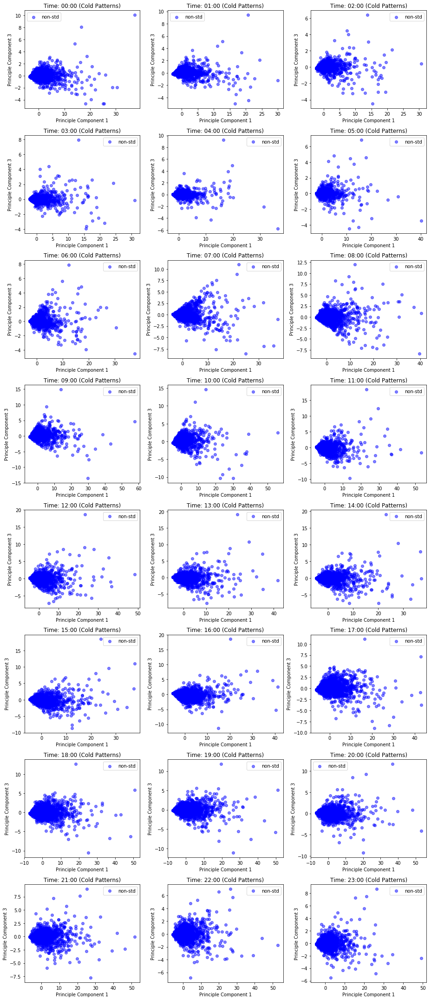

In [24]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(principleDf_nstd[0], principleDf_nstd[2], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
#         ax.scatter(principleDf[0], principleDf[2], c = 'red', label = 'std', alpha = 0.1)
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 1')
        ax.set_ylabel('Principle Component 3')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(principleDf_nstd[0], principleDf_nstd[2], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
#         ax.scatter(principleDf[0], principleDf[2], c = 'red', label = 'std', alpha = 0.1)
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 1')
        ax.set_ylabel('Principle Component 3')
plt.tight_layout()

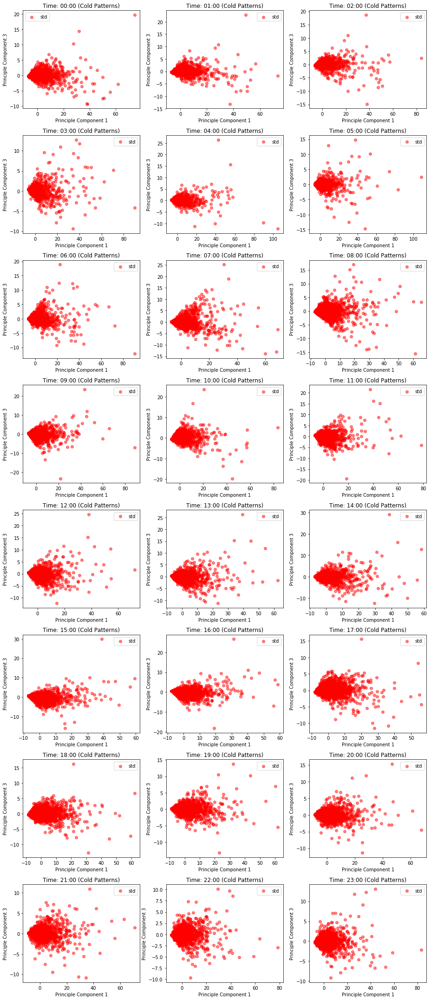

In [25]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
#         ax.scatter(principleDf_nstd[0], principleDf_nstd[2], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
        ax.scatter(principleDf[0], principleDf[2], c = 'red', label = 'std', alpha = 0.5)
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 1')
        ax.set_ylabel('Principle Component 3')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
#         ax.scatter(principleDf_nstd[0], principleDf_nstd[2], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
        ax.scatter(principleDf[0], principleDf[2], c = 'red', label = 'std', alpha = 0.5)
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 1')
        ax.set_ylabel('Principle Component 3')
plt.tight_layout()

Component 2 and Component 3 relationship is shown below

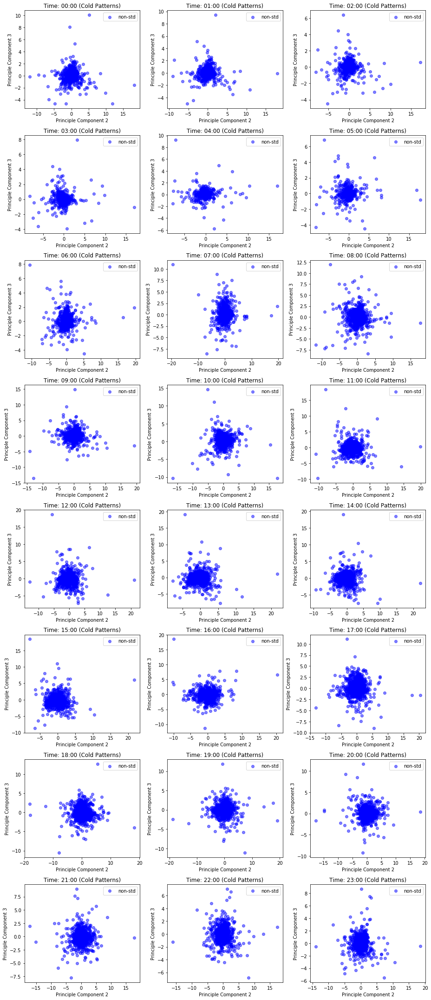

In [26]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(principleDf_nstd[1], principleDf_nstd[2], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
#         ax.scatter(principleDf[1], principleDf[2], c = 'red', label = 'std', alpha = 0.5)
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 2')
        ax.set_ylabel('Principle Component 3')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(principleDf_nstd[1], principleDf_nstd[2], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
#         ax.scatter(principleDf[1], principleDf[2], c = 'red', label = 'std', alpha = 0.5)
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 2')
        ax.set_ylabel('Principle Component 3')
plt.tight_layout()

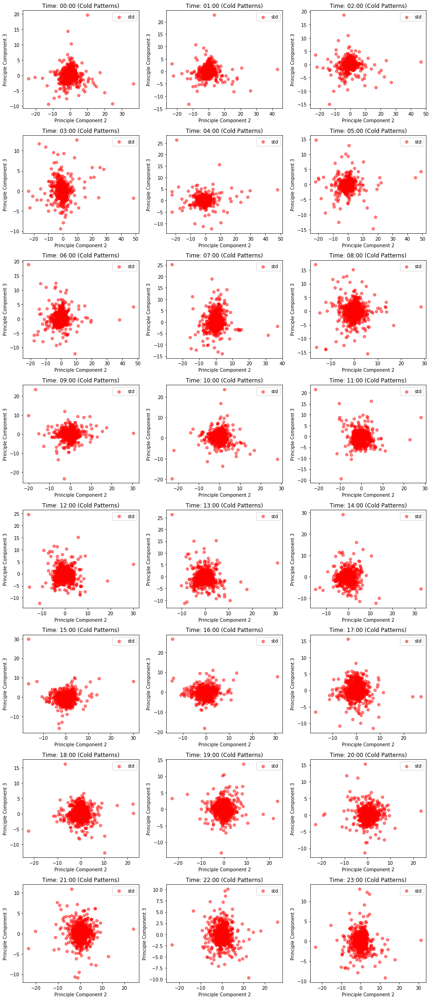

In [27]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
#         ax.scatter(principleDf_nstd[1], principleDf_nstd[2], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
        ax.scatter(principleDf[1], principleDf[2], c = 'red', label = 'std', alpha = 0.5)
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 2')
        ax.set_ylabel('Principle Component 3')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
#         ax.scatter(principleDf_nstd[1], principleDf_nstd[2], c = 'blue', label = 'non-std', alpha = 0.5)
        # PCA with standardization
        x = x.values
        x = StandardScaler().fit_transform(x)
        pca = PCA()# keep all columns to cover 100% variance
        principleComponents = pca.fit_transform(x)
        principleDf = pd.DataFrame(data = principleComponents)
        ax.scatter(principleDf[1], principleDf[2], c = 'red', label = 'std', alpha = 0.5)
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Principle Component 2')
        ax.set_ylabel('Principle Component 3')
plt.tight_layout()

The above three types of plots show that std don't have significant advantage in this case, so we will use non-std in our later analysis.

Let's try to interprete PCs' meaning: 

(1) PC1's coefficients vs Temperature:

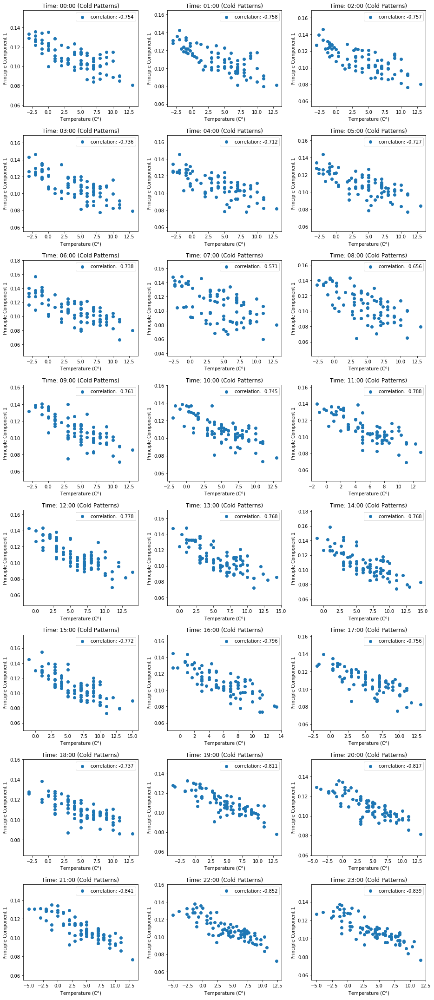

In [28]:
fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(df_wea1h_nf_cold.TempC[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')], pca_nstd.components_[0], label = 'correlation: ' + str(round(np.corrcoef(pca_nstd.components_[0], df_wea1h_nf_cold.TempC[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')])[0][1], 3)))
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel(r'Temperature (C$^o$)')
        ax.set_ylabel('Principle Component 1')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(df_wea1h_nf_cold.TempC[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')], pca_nstd.components_[0], label = 'correlation: ' + str(round(np.corrcoef(pca_nstd.components_[0], df_wea1h_nf_cold.TempC[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')])[0][1], 3)))
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel(r'Temperature (C$^o$)')
        ax.set_ylabel('Principle Component 1')
plt.tight_layout()

2) PC2's coefficients  vs Temperature:

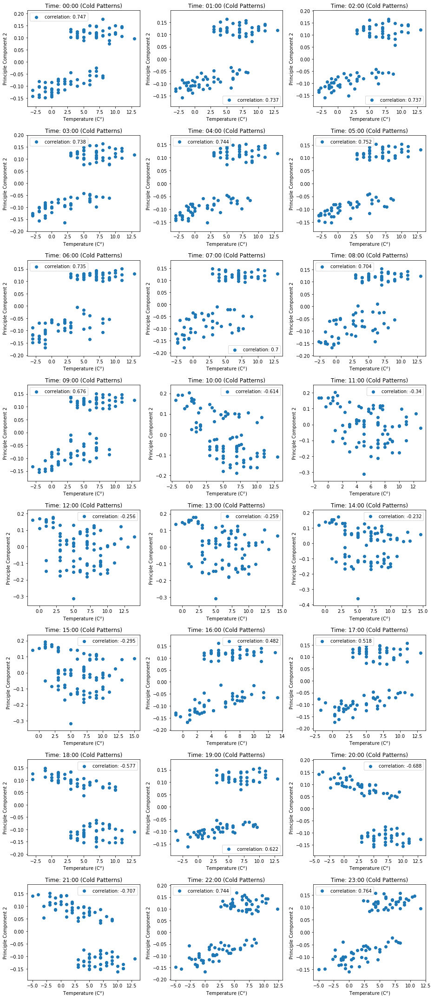

In [29]:
fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(df_wea1h_nf_cold.TempC[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')], pca_nstd.components_[1], label = 'correlation: ' + str(round(np.corrcoef(pca_nstd.components_[1], df_wea1h_nf_cold.TempC[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')])[0][1], 3)))
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel(r'Temperature (C$^o$)')
        ax.set_ylabel('Principle Component 2')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(df_wea1h_nf_cold.TempC[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')], pca_nstd.components_[1], label = 'correlation: ' + str(round(np.corrcoef(pca_nstd.components_[1], df_wea1h_nf_cold.TempC[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')])[0][1], 3)))
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel(r'Temperature (C$^o$)')
        ax.set_ylabel('Principle Component 2')
plt.tight_layout()

The above figures show that PC2 still has certain amount of correlation with temperature but not as significant as PC1 and temperature have.

3) PC3's coefficients vs Day of a Week:

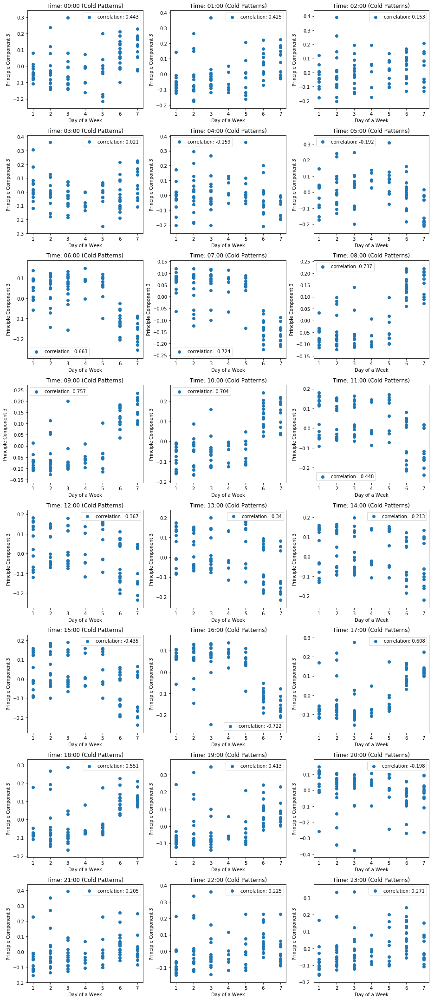

In [30]:
fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        dayofWeek= pd.DataFrame(pd.to_datetime(x.GMT).dt.dayofweek)
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(dayofWeek + 1, pca_nstd.components_[2], label = 'correlation: ' + str(round(np.corrcoef(pca_nstd.components_[2], dayofWeek.GMT)[0][1], 3)))
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Day of a Week')
        ax.set_ylabel('Principle Component 3')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        dayofWeek= pd.DataFrame(pd.to_datetime(x.GMT).dt.dayofweek)
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        ax.scatter(dayofWeek + 1, pca_nstd.components_[2], label = 'correlation: ' + str(round(np.corrcoef(pca_nstd.components_[2], dayofWeek.GMT)[0][1], 3)))
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel('Day of a Week')
        ax.set_ylabel('Principle Component 3')
plt.tight_layout()

## 2. K-mean clustering
Milestone 4: K-mean clustering

The first three PCs are selected as inputs for K-mean clustering, due to their significance and interpretability

In [31]:
x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('00:00:00')]
t = x.dropna(axis = 'columns')
t2 = t[t.columns[np.insert(kmeans.labels_ == 0, 0, True)]].copy() # select all data from the n-th cluster
t2['TempC'] = np.round(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('00:00:00')]['TempC'].values) # add temperature column to dataframe
t2['DayofWeek'] = pd.to_datetime(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('00:00:00')]['GMT']).dt.dayofweek # add day of a week column to dataframe
t2
fig_all = plt.figure(figsize = (10,8))
ax = fig_all.add_subplot(1, 1, 1, projection = '3d')
for i in range(1, 1 + 528):
    ax.scatter(t2[t2.columns[-2]], t2[t2.columns[-1]], t2[t2.columns[i]], color = 'red')

t2 = t[t.columns[np.insert(kmeans.labels_ == 1, 0, True)]].copy() # select all data from the n-th cluster
t2['TempC'] = np.round(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('00:00:00')]['TempC'].values) # add temperature column to dataframe
t2['DayofWeek'] = pd.to_datetime(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('00:00:00')]['GMT']).dt.dayofweek # add day of a week column to dataframe
for i in range(1, 1 + 107):
    ax.scatter(t2[t2.columns[-2]], t2[t2.columns[-1]], t2[t2.columns[i]], color = 'green')
    
t2 = t[t.columns[np.insert(kmeans.labels_ == 2, 0, True)]].copy() # select all data from the n-th cluster
t2['TempC'] = np.round(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('00:00:00')]['TempC'].values) # add temperature column to dataframe
t2['DayofWeek'] = pd.to_datetime(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('00:00:00')]['GMT']).dt.dayofweek # add day of a week column to dataframe
for i in range(1, 1 + 25):
    ax.scatter(t2[t2.columns[-2]], t2[t2.columns[-1]], t2[t2.columns[i]], color = 'blue')

IndexError: boolean index did not match indexed array along dimension 0; dimension is 2552 but corresponding boolean dimension is 3721

In [424]:
# the first groups consumption dataframe

(kmeans.labels_ == 2).sum()

25

In [ ]:
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D 
fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1, projection = '3d')
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        dayofWeek= pd.DataFrame(pd.to_datetime(x.GMT).dt.dayofweek)
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = 3).fit(principleDf_nstd.iloc[:,:3])
        ax.scatter(principleDf_nstd[1], principleDf_nstd[2], principleDf_nstd[0], c = (kmeans.labels_*10), cmap = 'rainbow')
        # what is the center of the cluster
        kmeans.cluster_centers_
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.set_xlabel('PC2')
        ax.set_ylabel('PC3')
        ax.set_zlabel('PC1')
#     else:
#         x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
#         dayofWeek= pd.DataFrame(pd.to_datetime(x.GMT).dt.dayofweek)
#         x.set_index('GMT', inplace = True)
#         x = x.transpose().dropna() # data for the specific hour, and filtering out null value
#         # PCA without standardization
#         pca_nstd = PCA()
#         principleComponents_nstd = pca_nstd.fit_transform(x)
#         principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
#         kmeans = KMeans(n_clusters = 3).fit(principleDf_nstd.iloc[:,:3])
#         ax.scatter(principleDf_nstd[1], principleDf_nstd[2], principleDf_nstd[0], c = (kmeans.labels_*10), cmap = 'rainbow')
#         ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
#         ax.set_xlabel('PC2')
#         ax.set_ylabel('PC3')
#         ax.set_zlabel('PC1')
plt.tight_layout()

In [44]:
x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(0) + ':00:00')]
dayofWeek= pd.DataFrame(pd.to_datetime(x.GMT).dt.dayofweek)
x.set_index('GMT', inplace = True)
x = x.transpose().dropna()
x

GMT,2013-01-01 00:00:00,2013-01-02 00:00:00,2013-01-03 00:00:00,2013-01-05 00:00:00,2013-01-06 00:00:00,2013-01-09 00:00:00,2013-01-12 00:00:00,2013-01-14 00:00:00,2013-01-15 00:00:00,2013-01-18 00:00:00,...,2013-12-17 00:00:00,2013-12-18 00:00:00,2013-12-21 00:00:00,2013-12-22 00:00:00,2013-12-23 00:00:00,2013-12-24 00:00:00,2013-12-25 00:00:00,2013-12-27 00:00:00,2013-12-28 00:00:00,2013-12-31 00:00:00
N0000,1.038,0.324,0.475,0.415,0.316,0.315,0.603,0.297,0.309,0.318,...,0.391,0.620,0.549,0.334,0.569,0.200,0.260,0.380,0.479,0.509
N0001,0.232,0.264,0.267,0.237,0.264,0.195,0.092,0.099,0.240,0.298,...,0.641,0.651,0.653,0.652,0.647,0.652,0.631,0.622,0.648,0.647
N0002,0.052,0.387,0.101,0.094,0.037,0.085,0.055,0.410,0.100,0.503,...,0.100,0.094,0.041,0.107,0.066,0.039,0.040,0.107,0.098,0.066
N0003,0.256,0.112,0.133,0.084,0.199,0.074,0.093,0.282,0.055,0.083,...,0.211,0.431,0.221,0.290,0.241,0.200,0.641,0.376,0.215,0.288
N0004,0.181,1.156,1.322,0.368,0.990,0.235,0.792,0.569,0.106,0.583,...,0.690,0.720,0.818,0.921,0.541,0.681,0.712,0.774,0.710,0.852
N0005,0.773,0.153,0.244,0.142,0.075,0.204,0.179,0.152,0.146,0.170,...,0.044,0.138,0.275,0.690,0.099,0.288,0.158,0.161,1.021,0.075
N0006,0.000,0.000,0.000,0.000,0.000,0.000,0.006,0.058,0.047,0.042,...,0.000,0.000,0.000,0.000,0.157,0.068,0.069,0.086,0.047,0.110
N0007,0.163,0.159,0.161,0.153,0.167,0.167,0.197,0.174,0.173,0.149,...,0.170,0.156,0.167,0.173,0.173,0.719,0.157,0.154,0.160,0.164
N0008,0.261,0.149,0.134,0.149,0.769,0.123,0.155,0.185,0.181,0.102,...,0.428,0.594,0.564,0.473,0.681,0.190,0.154,0.343,0.490,0.297
N0009,1.042,0.641,0.780,0.511,0.856,0.478,1.834,0.874,0.545,0.548,...,0.638,0.532,0.612,0.587,0.574,0.606,0.639,0.590,1.208,0.682


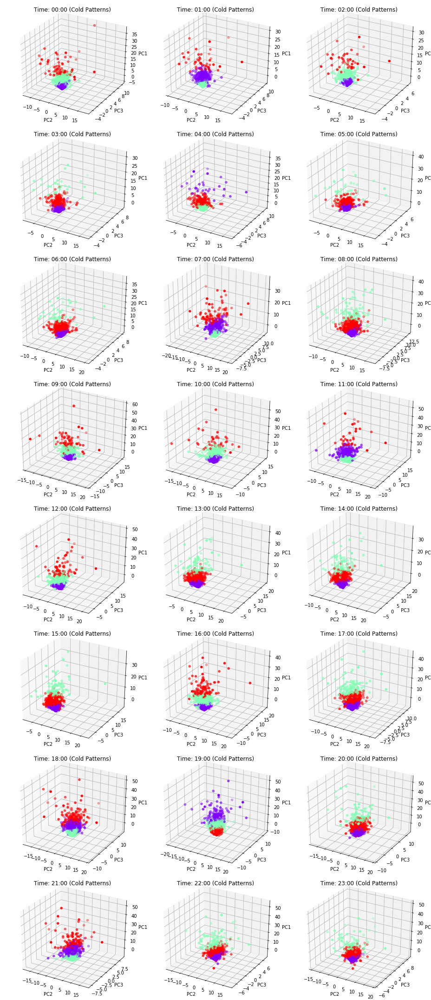

In [32]:
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D 
fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1, projection = '3d')
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        dayofWeek= pd.DataFrame(pd.to_datetime(x.GMT).dt.dayofweek)
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = 3).fit(principleDf_nstd.iloc[:,:3])
        ax.scatter(principleDf_nstd[1], principleDf_nstd[2], principleDf_nstd[0], c = (kmeans.labels_*10), cmap = 'rainbow')
        # what is the center of the cluster
        kmeans.cluster_centers_
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.set_xlabel('PC2')
        ax.set_ylabel('PC3')
        ax.set_zlabel('PC1')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        dayofWeek= pd.DataFrame(pd.to_datetime(x.GMT).dt.dayofweek)
        x.set_index('GMT', inplace = True)
        x = x.transpose().dropna() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = 3).fit(principleDf_nstd.iloc[:,:3])
        ax.scatter(principleDf_nstd[1], principleDf_nstd[2], principleDf_nstd[0], c = (kmeans.labels_*10), cmap = 'rainbow')
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.set_xlabel('PC2')
        ax.set_ylabel('PC3')
        ax.set_zlabel('PC1')
plt.tight_layout()

The ways of checking the clustering theta threshold condition

In [323]:
kmeans.cluster_centers_[1]

array([13.69917824,  0.46278999, -0.14054859])

In [348]:
np.square(kmeans.cluster_centers_[1]).sum() * 0.2

37.580282564512224

In [324]:
principleDf_nstd.iloc[kmeans.labels_ == 1][2].mean()

-0.14054858878175358

In [366]:
(7+189+441)/976

0.6526639344262295

In [379]:
test = principleDf_nstd.iloc[kmeans.labels_ == 0][[0,1,2]] - kmeans.cluster_centers_[0]
sum(np.square(test).sum(axis = 1) > np.square(kmeans.cluster_centers_[0]).sum() * 0.2)

0

In [385]:
test = principleDf_nstd.iloc[kmeans.labels_ == 1][[0,1,2]] - kmeans.cluster_centers_[1]
sum(np.square(test).sum(axis = 1) > np.square(kmeans.cluster_centers_[1]).sum() * 0.2)

63

In [384]:
test = principleDf_nstd.iloc[kmeans.labels_ == 2][[0,1,2]] - kmeans.cluster_centers_[2]
sum(np.square(test).sum(axis = 1) > np.square(kmeans.cluster_centers_[2]).sum() * 0.2)

118

In [383]:
test = principleDf_nstd.iloc[kmeans.labels_ == 3][[0,1,2]] - kmeans.cluster_centers_[3]
sum(np.square(test).sum(axis = 1) > np.square(kmeans.cluster_centers_[3]).sum() * 0.2)

1

In [395]:
tot = 0
for i in range(50):
    test = principleDf_nstd.iloc[kmeans.labels_ == i][[0,1,2]] - kmeans.cluster_centers_[i]
    tot = tot + sum(np.square(test).sum(axis = 1) > np.square(kmeans.cluster_centers_[i]).sum() * 0.2)
tot

184

In [359]:
kmeans.cluster_centers_[2]

array([-1.85445773,  0.06602678, -0.00851691])

General consumptions distribution property of each cluster at each hour

In [ ]:
x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(0) + ':00:00')]
# dayofWeek= pd.DataFrame(pd.to_datetime(x.GMT).dt.dayofweek)
x.set_index('GMT', inplace = True)
x = x.transpose().dropna()
x

In [47]:
x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(0) + ':00:00')]
x.set_index('GMT', inplace = True)
t = x.dropna(axis=1) # data used for analyzing consumption distribution
# t = t.dropna(axis=1)
t

,N0000,N0001,N0002,N0003,N0004,N0005,N0006,N0007,N0008,N0009,...,N4162,N4163,N4164,N4165,N4166,N4167,N4168,N4170,N4171,N4172
GMT,,,,,,,,,,,,,,,,,,,,,
2013-01-01 00:00:00,1.038,0.232,0.052,0.256,0.181,0.773,0.000,0.163,0.261,1.042,...,0.150,0.187,0.051,0.087,0.020,0.586,0.201,0.254,0.102,0.132
2013-01-02 00:00:00,0.324,0.264,0.387,0.112,1.156,0.153,0.000,0.159,0.149,0.641,...,0.086,0.383,0.050,0.063,0.045,0.189,0.204,0.135,0.124,0.311
2013-01-03 00:00:00,0.475,0.267,0.101,0.133,1.322,0.244,0.000,0.161,0.134,0.780,...,0.080,0.509,0.039,0.067,0.051,0.234,0.197,0.149,0.169,0.283
2013-01-05 00:00:00,0.415,0.237,0.094,0.084,0.368,0.142,0.000,0.153,0.149,0.511,...,0.184,0.584,0.106,0.084,0.062,0.204,0.199,0.171,0.052,0.195
2013-01-06 00:00:00,0.316,0.264,0.037,0.199,0.990,0.075,0.000,0.167,0.769,0.856,...,0.128,0.483,0.033,0.054,0.103,0.195,0.186,0.351,0.020,0.352
2013-01-09 00:00:00,0.315,0.195,0.085,0.074,0.235,0.204,0.000,0.167,0.123,0.478,...,0.081,0.386,0.030,0.084,0.063,0.201,0.197,0.346,0.094,0.142
2013-01-12 00:00:00,0.603,0.092,0.055,0.093,0.792,0.179,0.006,0.197,0.155,1.834,...,0.096,0.420,0.045,0.067,0.021,0.195,0.354,0.253,0.020,0.275
2013-01-14 00:00:00,0.297,0.099,0.410,0.282,0.569,0.152,0.058,0.174,0.185,0.874,...,0.076,0.506,0.040,0.068,0.029,0.173,0.240,0.130,0.103,0.147
2013-01-15 00:00:00,0.309,0.240,0.100,0.055,0.106,0.146,0.047,0.173,0.181,0.545,...,0.088,0.489,0.025,0.066,0.200,0.254,0.192,0.193,0.101,0.188


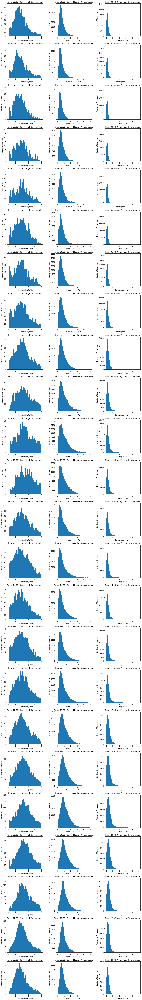

In [33]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D 
n = 3 # cluster numbers
cons_type = ['High Consumption', 'Medium Consumption', 'Low Consumption']
fig_all = plt.figure(figsize = (13,90))
for i in range(24):
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        t = x.dropna(axis=1) # data used for analyzing consumption distribution
#         t = t.dropna(axis=1)
        x = t.transpose() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n).fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        for k in range(n):
            cluster_dict[k] = (kmeans.labels_ == k).sum() # store the labels and the number of data in a dict
        sorted_label = sorted(cluster_dict.items(), key=lambda kv: kv[1])
        for k in range(n):
            ax = fig_all.add_subplot(24, 3, i * 3 + k + 1)
            t2 = t[t.columns[kmeans.labels_ == sorted_label[k][0]]].copy() # select all data from the n-th cluster
            t2['TempC'] = np.round(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]['TempC'].values) # add temperature column to dataframe
            ax.hist(t2[t2.columns[1:-1]].values.flatten(), bins=100, range=(0,5))
            ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold) - ' + str(cons_type[k]))
            ax.set_xlabel('Consumption (kWh)')
            ax.set_ylabel('Number of Occurence')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        t = x.dropna(axis=1) # data used for analyzing consumption distribution
#         t = t.dropna(axis=1)
        x = t.transpose() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n).fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        for k in range(n):
            cluster_dict[k] = (kmeans.labels_ == k).sum() # store the labels and the number of data in a dict
        sorted_label = sorted(cluster_dict.items(), key=lambda kv: kv[1])
        for k in range(n):
            ax = fig_all.add_subplot(24, 3, i * 3 + k + 1)
            t2 = t[t.columns[kmeans.labels_ == sorted_label[k][0]]].copy() # select all data from the n-th cluster
            t2['TempC'] = np.round(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]['TempC'].values) # add temperature column to dataframe
            ax.hist(t2[t2.columns[1:-1]].values.flatten(), bins=100, range=(0,5))
            ax.set_title('Time: ' + str(i) + ':00' + ' (Cold) - ' + str(cons_type[k]))
            ax.set_xlabel('Consumption (kWh)')
            ax.set_ylabel('Number of Occurence')
plt.tight_layout()

General days of a week distribution property of each cluster at each hour

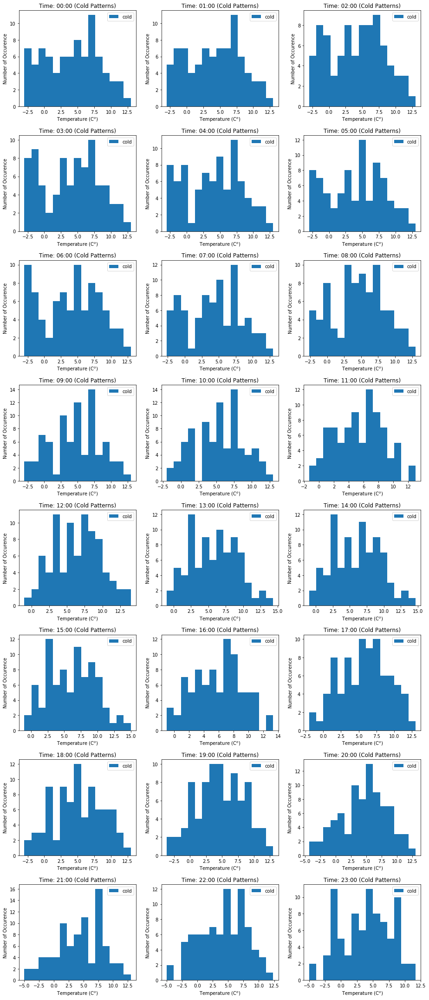

In [34]:
# temperature distribution of different hours of a day in a year
fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    ax = fig_all.add_subplot(8, 3, i + 1)
    if i <= 9:
        ax.hist(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]['TempC'], bins=15, label = 'cold')
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel(r'Temperature (C$^o$)')
        ax.set_ylabel('Number of Occurence')
    else:
        ax.hist(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]['TempC'], bins=15, label = 'cold')
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold Patterns)')
        ax.legend()
        ax.set_xlabel(r'Temperature (C$^o$)')
        ax.set_ylabel('Number of Occurence')
plt.tight_layout()

The distribution of days of a week (since it's non-event days, so it's worth checking this property)

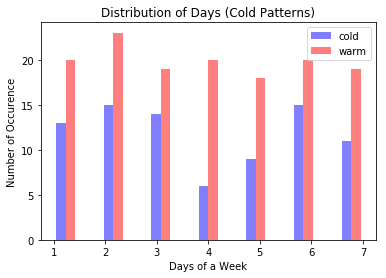

In [35]:
# temperature distribution of different hours of a day in a year
fig_all = plt.figure(figsize = (6,4))
ax = fig_all.add_subplot(1, 1, 1)
ax.hist([pd.to_datetime(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('00:00:00')]['GMT']).dt.dayofweek + 1, 
         pd.to_datetime(df_wea1h_nf_warm[df_Ntou1h_nf_warm.GMT.str.contains('00:00:00')]['GMT']).dt.dayofweek + 1], bins=13, alpha = 0.5, color = ['blue', 'red'], label = ['cold', 'warm'])
ax.set_title('Distribution of Days' + ' (Cold Patterns)')
ax.legend()
ax.set_xlabel('Days of a Week')
ax.set_ylabel('Number of Occurence')
plt.show()

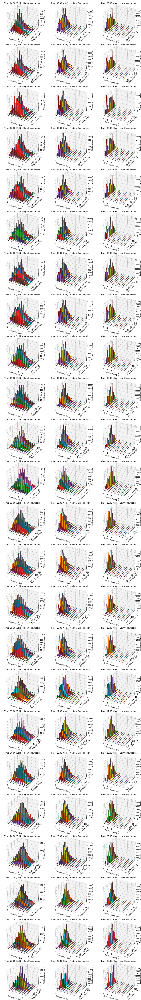

In [36]:
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D 
n = 3 # cluster numbers
cons_type = ['High Consumption', 'Medium Consumption', 'Low Consumption']
fig_all = plt.figure(figsize = (13,90))
for i in range(24):
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        t = x.dropna(axis=1) # data used for analyzing consumption distribution
        x = t.transpose() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n).fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        for k in range(n):
            cluster_dict[k] = (kmeans.labels_ == k).sum() # store the labels and the number of data in a dict
        sorted_label = sorted(cluster_dict.items(), key=lambda kv: kv[1])
        for k in range(n):
            ax = fig_all.add_subplot(24, 3, i * 3 + k + 1, projection = '3d')
            t2 = t[t.columns[kmeans.labels_ == sorted_label[k][0]]].copy() # select all data from the n-th cluster
            t2['TempC'] = np.round(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]['TempC'].values) # add temperature column to dataframe
            temp_list = list(set(t2['TempC']))
            temp_list.sort(reverse = True)
            for temp in temp_list:
                t3 = t2[t2['TempC'] == temp] # select the data with a specific temperature
                t3 = np.histogram(t3[t3.columns[1:-1]].values.flatten(), bins=10, range=(0,5))
                xpos = t3[1][:-1]
                ypos = np.ones(10) * temp
                num_elements = len(xpos)
                zpos = np.zeros(num_elements)
                dx = np.ones(10) * 0.15
                dy = np.ones(10) * 0.5
                dz = t3[0]
                pl = ax.bar3d(xpos, ypos, zpos, dx, dy, dz, alpha = 0.5, zsort='max')
                pl._sort_zpos = i * 3 + k + 1
            ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold) - ' + str(cons_type[k]))
            ax.set_xlabel('Consumption (kWh)')
            ax.set_ylabel(r'Temperature (C$^o$)')
            ax.set_zlabel('Number of Occurence')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        t = x.dropna(axis=1) # data used for analyzing consumption distribution
        x = t.transpose() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n).fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        for k in range(n):
            cluster_dict[k] = (kmeans.labels_ == k).sum() # store the labels and the number of data in a dict
        sorted_label = sorted(cluster_dict.items(), key=lambda kv: kv[1])
        for k in range(n):
            ax = fig_all.add_subplot(24, 3, i * 3 + k + 1, projection = '3d')
            t2 = t[t.columns[kmeans.labels_ == sorted_label[k][0]]].copy() # select all data from the n-th cluster
            t2['TempC'] = np.round(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]['TempC'].values) # add temperature column to dataframe
            temp_list = list(set(t2['TempC']))
            temp_list.sort(reverse = True)
            for temp in temp_list:
                t3 = t2[t2['TempC'] == temp] # select the data with a specific temperature
                t3 = np.histogram(t3[t3.columns[1:-1]].values.flatten(), bins=10, range=(0,5))
                xpos = t3[1][:-1]
                ypos = np.ones(10) * temp
                num_elements = len(xpos)
                zpos = np.zeros(num_elements)
                dx = np.ones(10) * 0.15
                dy = np.ones(10) * 0.5
                dz = t3[0]
                pl = ax.bar3d(xpos, ypos, zpos, dx, dy, dz, alpha = 0.5, zsort='max')
                pl._sort_zpos = i * 3 + k + 1
            ax.set_title('Time: ' +str(i) + ':00' + ' (Cold) - ' + str(cons_type[k]))
            ax.set_xlabel('Consumption (kWh)')
            ax.set_ylabel(r'Temperature (C$^o$)')
            ax.set_zlabel('Number of Occurence')
plt.tight_layout()

Most of the above plots show that the highest demand of each group happens around 8-10 celcius degree, except for 2 pm and 3 pm, which have the highest load around 5 celcius degree

In [40]:
t

,D0000,D0001,D0002,D0003,D0004,D0005,D0006,D0007,D0008,D0009,...,D1015,D1016,D1017,D1018,D1019,D1020,D1021,D1022,D1023,D1024
GMT,,,,,,,,,,,,,,,,,,,,,
2013-01-01 00:00:00,1.447,0.429000,0.451,0.155,0.397,0.106,0.307,0.268,0.390,0.123,...,0.048,0.033,0.502,0.117,0.378,1.143,0.155,0.343,0.176,0.117
2013-01-02 00:00:00,0.358,0.153000,0.463,0.169,0.356,0.255,0.436,0.364,0.167,0.104,...,0.061,0.027,0.605,0.673,0.348,0.574,0.111,0.331,0.328,0.146
2013-01-03 00:00:00,0.142,0.385000,0.463,0.154,0.476,0.425,0.829,0.349,0.111,0.435,...,0.080,0.088,0.272,0.093,0.551,0.335,0.093,0.360,0.197,0.342
2013-01-05 00:00:00,0.230,0.137000,0.421,0.156,0.062,0.323,0.498,0.234,0.501,0.202,...,0.045,0.010,0.317,0.096,0.232,0.525,0.087,0.357,0.173,0.137
2013-01-06 00:00:00,0.303,0.229000,0.468,0.158,0.075,0.275,0.467,0.313,0.522,0.403,...,0.185,0.010,0.268,0.105,0.425,0.321,0.242,0.357,0.183,0.206
2013-01-09 00:00:00,0.086,0.330000,0.250,0.156,0.064,0.397,0.418,0.295,0.512,0.221,...,0.067,0.010,0.454,0.091,0.209,0.481,0.092,0.345,0.188,0.196
2013-01-12 00:00:00,0.218,0.317000,0.410,0.149,0.055,0.451,0.410,0.234,0.428,0.285,...,0.083,0.010,0.369,0.089,0.569,0.519,0.094,0.346,0.233,0.393
2013-01-14 00:00:00,0.220,0.120000,0.288,0.147,0.055,0.378,0.540,0.185,0.545,0.297,...,0.066,0.611,0.459,0.079,1.062,0.483,0.112,0.400,0.293,0.445
2013-01-15 00:00:00,0.218,0.222000,0.292,0.149,0.055,0.385,0.336,0.205,0.573,0.239,...,0.030,0.074,0.394,0.102,1.051,0.356,0.099,0.347,0.300,0.322


In [44]:
i

23

In [45]:
pd.to_datetime(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('23:00:00')]['GMT']).dt.dayofweek

23      1
47      2
71      3
119     5
143     6
215     2
287     5
335     0
359     1
431     4
527     1
551     2
575     3
623     5
647     6
743     3
767     4
791     5
839     0
887     2
1031    1
1055    2
1079    3
1127    5
1199    1
1295    5
1319    6
1343    0
1487    6
1511    0
       ..
7583    1
7607    2
7655    4
7679    5
7703    6
7727    0
7751    1
7775    2
7823    4
7847    5
7871    6
7895    0
8063    0
8087    1
8135    3
8159    4
8231    0
8255    1
8279    2
8351    5
8423    1
8447    2
8519    5
8543    6
8567    0
8591    1
8615    2
8663    4
8687    5
8759    1
Name: GMT, Length: 83, dtype: int64

In [47]:
t2['DayofWeek'] = np.array(pd.to_datetime(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('23:00:00')]['GMT']).dt.dayofweek)
t2

,GMT,D0000,D0001,D0003,D0004,D0005,D0007,D0008,D0009,D0010,...,D1015,D1016,D1017,D1018,D1020,D1021,D1022,D1023,D1024,DayofWeek
0,2013-01-01 23:00:00,0.323,0.269,0.241,0.349,0.293,0.495,0.533,0.110,0.019,...,0.031,0.121,0.656,0.294,0.715,0.102,0.337,0.188,0.295,1
1,2013-01-02 23:00:00,0.232,0.452,0.153,0.500,0.458,0.357,0.268,0.327,0.028,...,0.036,0.166,0.394,0.087,0.400,0.142,0.348,0.237,0.503,2
2,2013-01-03 23:00:00,0.315,0.375,0.156,0.502,0.352,0.402,0.457,0.655,0.028,...,0.047,0.072,0.420,0.085,1.110,0.128,0.373,0.148,0.210,3
3,2013-01-05 23:00:00,0.064,0.403,0.206,0.263,0.288,0.457,0.463,0.624,0.024,...,0.080,0.136,0.368,0.083,0.455,0.502,0.357,0.164,0.183,5
4,2013-01-06 23:00:00,0.297,0.333,0.157,0.233,0.495,0.194,0.376,0.592,0.024,...,0.072,0.204,0.463,0.083,0.352,0.152,0.365,0.195,0.168,6
5,2013-01-09 23:00:00,0.164,0.245,0.153,0.057,0.326,0.220,0.437,0.230,0.020,...,0.033,0.048,0.439,0.091,0.365,0.110,0.351,0.233,0.579,2
6,2013-01-12 23:00:00,0.262,0.440,0.168,0.255,0.157,0.259,0.424,0.405,0.027,...,0.045,0.521,0.482,0.081,0.685,0.127,0.363,0.106,0.382,5
7,2013-01-14 23:00:00,1.416,0.479,0.147,0.064,0.384,0.239,0.501,0.291,0.018,...,0.107,0.271,0.418,0.086,0.355,0.136,0.350,0.198,0.223,0
8,2013-01-15 23:00:00,0.098,0.305,0.145,0.056,0.407,0.229,0.396,0.218,0.025,...,0.082,0.074,0.598,0.080,0.554,0.289,0.357,0.251,0.203,1
9,2013-01-18 23:00:00,0.299,0.367,0.141,0.265,0.459,0.219,0.447,0.250,0.022,...,0.057,0.780,0.460,0.100,0.496,0.186,0.341,0.717,0.267,4


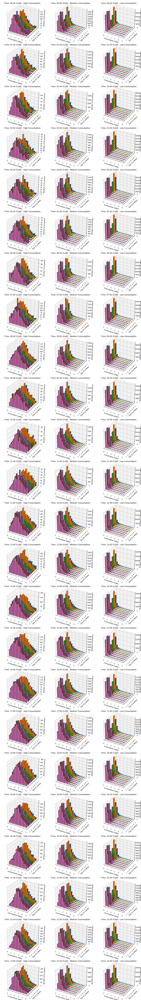

In [37]:
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D 
n = 3 # cluster numbers
cons_type = ['High Consumption', 'Medium Consumption', 'Low Consumption']
fig_all = plt.figure(figsize = (13,90))
for i in range(24):
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        t = x.dropna(axis=1) # data used for analyzing consumption distribution
        x = t.transpose() # data for the specific hour, and filtering out null value
        t.reset_index(inplace = True)
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n).fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        for k in range(n):
            cluster_dict[k] = (kmeans.labels_ == k).sum() # store the labels and the number of data in a dict
        sorted_label = sorted(cluster_dict.items(), key=lambda kv: kv[1])
        for k in range(n):
            ax = fig_all.add_subplot(24, 3, i * 3 + k + 1, projection = '3d')
            t2 = t[t.columns[np.insert(kmeans.labels_ == sorted_label[k][0], 0, True)]].copy() # select all data from the n-th cluster
            t2['DayofWeek'] = np.array(pd.to_datetime(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]['GMT']).dt.dayofweek) # add day of a week column to dataframe
            for day in reversed(range(7)):
                t3 = t2[t2['DayofWeek'] == day] # select the data with a specific day of a week
                t3 = np.histogram(t3[t3.columns[1:-1]].values.flatten(), bins=13, range=(0,5))
                xpos = t3[1][:-1] 
                ypos = np.ones(13) * (day+1)
                num_elements = len(xpos)
                zpos = np.zeros(num_elements)
                dx = np.ones(13) * 0.2
                dy = np.ones(13) * 0.5
                # dz = t3[0] / ((kmeans.labels_ == sorted_label[k][0]).sum() * (t2['DayofWeek'] == day).sum())
                dz = t3[0]
                pl = ax.bar3d(xpos, ypos, zpos, dx, dy, dz, alpha = 0.5, zsort='max')
                pl._sort_zpos = i * 3 + k + 1
            ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold) - ' + str(cons_type[k]))
            ax.set_xlabel('Consumption (kWh)')
            ax.set_ylabel('Day of a Week')
            ax.set_zlabel('Number of Occurence')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        t = x.dropna(axis=1) # data used for analyzing consumption distribution
        x = t.transpose() # data for the specific hour, and filtering out null value
        t.reset_index(inplace = True)
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n).fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        for k in range(n):
            cluster_dict[k] = (kmeans.labels_ == k).sum() # store the labels and the number of data in a dict
        sorted_label = sorted(cluster_dict.items(), key=lambda kv: kv[1])
        for k in range(n):
            ax = fig_all.add_subplot(24, 3, i * 3 + k + 1, projection = '3d')
            t2 = t[t.columns[np.insert(kmeans.labels_ == sorted_label[k][0], 0, True)]].copy() # select all data from the n-th cluster
            t2['DayofWeek'] = np.array(pd.to_datetime(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]['GMT']).dt.dayofweek) # add day of weeks column to dataframe
            for day in reversed(range(7)):
                t3 = t2[t2['DayofWeek'] == day] # select the data with a specific day of a week
                t3 = np.histogram(t3[t3.columns[1:-1]].values.flatten(), bins=13, range=(0,5))
                xpos = t3[1][:-1] 
                ypos = np.ones(13) * (day+1)
                num_elements = len(xpos)
                zpos = np.zeros(num_elements)
                dx = np.ones(13) * 0.2
                dy = np.ones(13) * 0.5
                # dz = t3[0] / ((kmeans.labels_ == sorted_label[k][0]).sum() * (t2['DayofWeek'] == day).sum())
                dz = t3[0]
                pl = ax.bar3d(xpos, ypos, zpos, dx, dy, dz, alpha = 0.5, zsort='max')
                pl._sort_zpos = i * 3 + k + 1
            ax.set_title('Time: ' + str(i) + ':00' + ' (Cold) - ' + str(cons_type[k]))
            ax.set_xlabel('Consumption (kWh)')
            ax.set_ylabel('Day of a Week')
            ax.set_zlabel('Number of Occurence')
plt.tight_layout()

Plot the three groups generated by PCA and k-mean clustering, in a space with 3 dimensions, temperature, day of week and consumption, and see if there is any obvious pattern.

In [ ]:
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D 
n = 3 # cluster numbers
cons_type = ['High', 'Medium', 'Low']
color_type = ['red', 'yellow', 'blue']
fig_all = plt.figure(figsize = (13,30))
for i in range(24):
    print(i)
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        t = x.dropna(axis=1) # data used for analyzing consumption distribution
        x = t.transpose() # data for the specific hour, and filtering out null value
        t.reset_index(inplace = True)
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n).fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        for k in range(n):
            cluster_dict[k] = (kmeans.labels_ == k).sum() # store the labels and the number of data in a dict
        sorted_label = sorted(cluster_dict.items(), key=lambda kv: kv[1])
        ax = fig_all.add_subplot(8, 3, i + 1, projection = '3d')
        for k in range(n):
            t2 = t[t.columns[np.insert(kmeans.labels_ == sorted_label[k][0], 0, True)]].copy() # select all data from the n-th cluster
            t2['TempC'] = np.round(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]['TempC'].values) # add temperature column to dataframe
            t2['DayofWeek'] = np.array(pd.to_datetime(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]['GMT']).dt.dayofweek) # add day of a week column to dataframe
            ax.scatter(t2[t2.columns[-2]], t2[t2.columns[-1]], t2[t2.columns[1]], color = color_type[k], label = cons_type[k])
            for j in range(2, 1 + sorted_label[k][1]):
                ax.scatter(t2[t2.columns[-2]], t2[t2.columns[-1]], t2[t2.columns[j]], color = color_type[k], alpha = 0.5)
                ax.legend()
        ax.set_title('Time: 0' + str(i) + ':00' + ' (Cold)')
        ax.set_xlabel(r'Temperature (C$^o$)')
        ax.set_ylabel('Day of a Week')
        ax.set_zlabel('Consumption (kWh)')
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        t = x.dropna(axis=1) # data used for analyzing consumption distribution
        x = t.transpose() # data for the specific hour, and filtering out null value
        t.reset_index(inplace = True)
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n).fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        for k in range(n):
            cluster_dict[k] = (kmeans.labels_ == k).sum() # store the labels and the number of data in a dict
        sorted_label = sorted(cluster_dict.items(), key=lambda kv: kv[1])
        ax = fig_all.add_subplot(8, 3, i + 1, projection = '3d')
        for k in range(n):
            t2 = t[t.columns[np.insert(kmeans.labels_ == sorted_label[k][0], 0, True)]].copy() # select all data from the n-th cluster
            t2['TempC'] = np.round(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]['TempC'].values) # add temperature column to dataframe
            t2['DayofWeek'] = np.array(pd.to_datetime(df_wea1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]['GMT']).dt.dayofweek) # add day of a week column to dataframe
            ax.scatter(t2[t2.columns[-2]], t2[t2.columns[-1]], t2[t2.columns[1]], color = color_type[k], label = cons_type[k])
            for j in range(2, 1 + sorted_label[k][1]):
                ax.scatter(t2[t2.columns[-2]], t2[t2.columns[-1]], t2[t2.columns[j]], color = color_type[k], alpha = 0.5)
                ax.legend()
        ax.set_title('Time: ' + str(i) + ':00' + ' (Cold)')
        ax.set_xlabel(r'Temperature (C$^o$)')
        ax.set_ylabel('Day of a Week')
        ax.set_zlabel('Consumption (kWh)')
plt.tight_layout()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


Let us deal with the classes of households. Each household should have a label vector of 24 hours.

In [8]:
df_Ntou1h_nf_cold.dropna(axis=1)

,GMT,N0000,N0001,N0002,N0003,N0004,N0006,N0007,N0008,N0010,...,N4150,N4152,N4154,N4157,N4159,N4163,N4164,N4165,N4166,N4172
0,2013-01-01 00:00:00,1.038,0.232,0.052,0.256,0.181,0.000,0.163,0.261,2.114,...,2.486,0.311,0.660,0.183,0.280,0.187,0.051,0.087,0.020,0.132
1,2013-01-01 01:00:00,0.484,0.267,0.101,0.192,0.185,0.000,0.152,0.090,2.132,...,2.066,0.031,0.307,0.158,0.201,0.304,0.045,0.066,0.115,0.140
2,2013-01-01 02:00:00,0.449,0.266,0.092,0.200,0.484,0.000,0.170,0.156,2.035,...,2.139,0.017,0.233,0.180,0.193,0.396,0.052,0.084,0.235,0.142
3,2013-01-01 03:00:00,0.390,0.230,0.034,0.262,0.132,0.000,0.152,0.094,1.914,...,1.706,0.014,0.211,0.197,0.191,0.355,0.111,0.066,0.021,0.147
4,2013-01-01 04:00:00,0.936,0.268,0.052,0.205,0.183,0.000,0.165,0.155,2.269,...,1.675,0.012,0.117,0.261,0.193,0.346,0.119,0.072,0.021,0.161
5,2013-01-01 05:00:00,0.388,0.265,0.100,0.199,0.112,0.000,0.159,0.085,4.034,...,1.415,0.012,0.099,0.252,0.190,0.343,0.049,0.075,0.832,0.191
6,2013-01-01 06:00:00,0.384,0.227,0.068,0.183,0.115,0.000,0.154,0.157,1.108,...,1.537,0.012,0.098,0.329,0.201,0.355,0.049,0.065,2.836,0.139
7,2013-01-01 07:00:00,0.406,0.264,0.033,0.253,0.117,0.000,0.169,0.185,0.590,...,1.558,0.012,0.098,0.277,0.190,0.324,0.263,0.071,3.820,0.154
8,2013-01-01 08:00:00,0.950,0.264,0.577,0.448,0.118,0.000,0.152,0.213,0.594,...,1.418,0.198,0.099,0.267,0.184,0.463,0.158,0.080,2.746,0.572
9,2013-01-01 09:00:00,0.448,0.228,0.238,0.598,0.305,0.000,0.167,0.151,0.576,...,1.658,0.164,0.169,0.215,0.498,0.337,0.113,0.070,1.347,0.463


In [14]:
len(kmeans.labels_)

3720

In [8]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D 
n = 3 # cluster numbers
n_house = 2551 # total household numbers
houseLabel = [] # store the 24hour group labels for each hoursehold
for i in range(2551):
    houseLabel.append('')
houseLabel = np.array(houseLabel)
cons_type = ['High Consumption', 'Medium Consumption', 'Low Consumption']
fig_all = plt.figure(figsize = (13,90))
for i in range(24):
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.dropna(axis=1).transpose() # data for the specific hour, and fill in null value with mean
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n, init='k-means++').fit(principleDf_nstd.iloc[:,:3])
        houseLabel = np.core.defchararray.add(houseLabel, kmeans.labels_.astype('str'))
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.dropna(axis=1).transpose() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n, init='k-means++').fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        houseLabel = np.core.defchararray.add(houseLabel, kmeans.labels_.astype('str'))
# We obtain the house Label shown below
# print(houseLabel)

# Group the house based on their 24 hour labels
houseLableDf = pd.DataFrame()
houseLableDf['House'] = df_Ntou1h_nf_cold.columns[1:]
houseLableDf['Label'] = houseLabel
houseGroupDf = houseLableDf.groupby('Label').size().reset_index(name='counts')
houseGroupDf = houseGroupDf.sort_values(by=['counts'], ascending=False)
houseGroupDf

,Label,counts
140,000002001000021002201000,1088
853,112210210211200211020222,50
953,221121122122112120112111,16
357,000002011000021002201000,15
152,000002001000021002221000,14
521,100002001000021002201000,13
29,000002000000021002201000,13
142,000002001000021002201020,12
127,000002001000021002001000,12
119,000002001000021001001000,11


<Figure size 936x6480 with 0 Axes>

Note that the generated labels for the first 3 groups may change a bit each time, this is because some group of points which are very close to each other also have equal distance two both cluster centers, which leads to different label names. However, this won't affect the group property, we will show we run it for 100 times, and average 24 hour load curve of every time will be ploted. And you will see, the average load curve almost doesn't change. So label names wouldn't be an important concern here, we more care about the property of groups themselves. In addition, from the above result we can see the first 4 groups each has more than 10 household in it. Next what we want to do is to plot the load property of each group, and see how does there average 24 hour load look like.

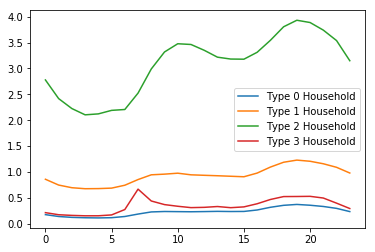

In [9]:
for i in range(4):
    load = []
    for j in range(24):
        if j <= 9:
            x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(j) + ':00:00')]
            x.set_index('GMT', inplace = True)
            x = x.dropna(axis=1)
            x = x[list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[i]].House)]
            load.append(x.mean().mean())
        else:
            x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(j) + ':00:00')]
            x.set_index('GMT', inplace = True)
            x = x.dropna(axis=1)
            x = x[list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[i]].House)]
            load.append(x.mean().mean())
    plt.plot(load, label = 'Type ' + str(i) + ' Household')
plt.legend()
plt.show()

Note: the above grouping process are based on kmean-clustering, it's worth mentioning that, the kmean-clustering results highly realted to the initial value randomization. And it seems that this randomization affects the household 24 hour group significantly. So this means that it may not be an appropriate approach to use k-mean clustering algorithm here for the household grouping.

For example, if we specify the kmean to be randomized initilization, and see if the final main groups have a significant difference.

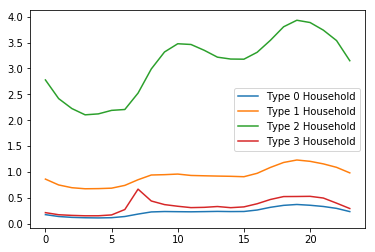

In [10]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D 
n = 3 # cluster numbers
n_house = 2551 # total household numbers
houseLabel = [] # store the 24hour group labels for each hoursehold
for i in range(2551):
    houseLabel.append('')
houseLabel = np.array(houseLabel)
cons_type = ['High Consumption', 'Medium Consumption', 'Low Consumption']
for i in range(24):
    if i <= 9:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.fillna(x.mean()).transpose() # data for the specific hour, and fill in null value with mean
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n, init='k-means++').fit(principleDf_nstd.iloc[:,:3])
        houseLabel = np.core.defchararray.add(houseLabel, kmeans.labels_.astype('str'))
    else:
        x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.fillna(x.mean()).transpose() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n, init='k-means++').fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        houseLabel = np.core.defchararray.add(houseLabel, kmeans.labels_.astype('str'))
# We obtain the house Label shown below
# print(houseLabel)

# Group the house based on their 24 hour labels
houseLableDf = pd.DataFrame()
houseLableDf['House'] = df_Ntou1h_nf_cold.columns[1:]
houseLableDf['Label'] = houseLabel
houseGroupDf = houseLableDf.groupby('Label').size().reset_index(name='counts')
houseGroupDf = houseGroupDf.sort_values(by=['counts'], ascending=False)

for i in range(4):
    load = []
    for j in range(24):
        if j <= 9:
            x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains('0' + str(j) + ':00:00')]
            x.set_index('GMT', inplace = True)
            x = x.fillna(x.mean())
            x = x[list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[i]].House)]
            load.append(x.mean().mean())
        else:
            x = df_Ntou1h_nf_cold[df_Ntou1h_nf_cold.GMT.str.contains(str(j) + ':00:00')]
            x.set_index('GMT', inplace = True)
            x = x.fillna(x.mean())
            x = x[list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[i]].House)]
            load.append(x.mean().mean())
    plt.plot(load, label = 'Type ' + str(i) + ' Household')
plt.legend()
plt.show()

Some observations and thoughts of the above daily load curves:

1) the type 0 household with the most amount of households has a relatively smooth and low consumption during a day, they consume the most amount of energy around 19:00, and consume least at 02:00-05:00.

2) type 1 household is high energy consumption households, besides of all the consumption is around 4 times the consumption of type 0 group, they have a relatively similar trend of energy usage pattern peak at 19:00 and valley at 02:00-05:00

3) type 2 household has a special usage pattern where their peak happens at 17:00 (maybe they come back home earlier), other parts about the same.

4) type 3 household also has a special usage pattern, where their peak happens at 09:00 (maybe they work in the morning, at home with some works that consumes a lot of energy, maybe breakfast, maybe heating at every morning?)

For warm season

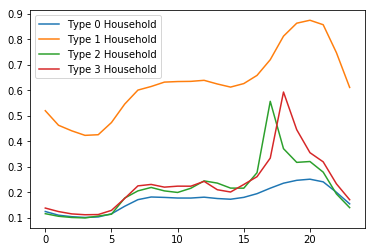

In [9]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D 
n = 3 # cluster numbers
n_house = 2018 # total household numbers
houseLabel = [] # store the 24hour group labels for each hoursehold
for i in range(2018):
    houseLabel.append('')
houseLabel = np.array(houseLabel)
cons_type = ['High Consumption', 'Medium Consumption', 'Low Consumption']
for i in range(24):
    if i <= 9:
        x = df_Ntou1h_nf_warm[df_Ntou1h_nf_warm.GMT.str.contains('0' + str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.fillna(x.mean()).transpose() # data for the specific hour, and fill in null value with mean
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n, init='k-means++').fit(principleDf_nstd.iloc[:,:3])
        houseLabel = np.core.defchararray.add(houseLabel, kmeans.labels_.astype('str'))
    else:
        x = df_Ntou1h_nf_warm[df_Ntou1h_nf_warm.GMT.str.contains(str(i) + ':00:00')]
        x.set_index('GMT', inplace = True)
        x = x.fillna(x.mean()).transpose() # data for the specific hour, and filtering out null value
        # PCA without standardization
        pca_nstd = PCA()
        principleComponents_nstd = pca_nstd.fit_transform(x)
        principleDf_nstd = pd.DataFrame(data = principleComponents_nstd)
        kmeans = KMeans(n_clusters = n, init='k-means++').fit(principleDf_nstd.iloc[:,:3])
        cluster_dict = {}
        houseLabel = np.core.defchararray.add(houseLabel, kmeans.labels_.astype('str'))
# We obtain the house Label shown below
# print(houseLabel)

# Group the house based on their 24 hour labels
houseLableDf = pd.DataFrame()
houseLableDf['House'] = df_Ntou1h_nf_warm.columns[1:]
houseLableDf['Label'] = houseLabel
houseGroupDf = houseLableDf.groupby('Label').size().reset_index(name='counts')
houseGroupDf = houseGroupDf.sort_values(by=['counts'], ascending=False)

for i in range(4):
    load = []
    for j in range(24):
        if j <= 9:
            x = df_Ntou1h_nf_warm[df_Ntou1h_nf_warm.GMT.str.contains('0' + str(j) + ':00:00')]
            x.set_index('GMT', inplace = True)
            x = x.fillna(x.mean())
            x = x[list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[i]].House)]
            load.append(x.mean().mean())
        else:
            x = df_Ntou1h_nf_warm[df_Ntou1h_nf_warm.GMT.str.contains(str(j) + ':00:00')]
            x.set_index('GMT', inplace = True)
            x = x.fillna(x.mean())
            x = x[list(houseLableDf[houseLableDf.Label == houseGroupDf.Label.iloc[i]].House)]
            load.append(x.mean().mean())
    plt.plot(load, label = 'Type ' + str(i) + ' Household')
plt.legend()
plt.show()